In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Preprocessing,Standardizing
from sklearn.preprocessing import StandardScaler

#For Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Models
from sklearn.model_selection import train_test_split,RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

#Metrics
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

# Train Data

In [2]:
df=pd.read_csv('train.csv')
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


# EDA

In [3]:
df.shape

(1168, 81)

We have 1168 rows and 81 columns in the dataset

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

We see null values in some of the features and that data types are of object ant int. SalePrice is our Target variable.

In [5]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


Apart from the missing values, we can see some of the features have outliers present in it along with the skewness.

<AxesSubplot:>

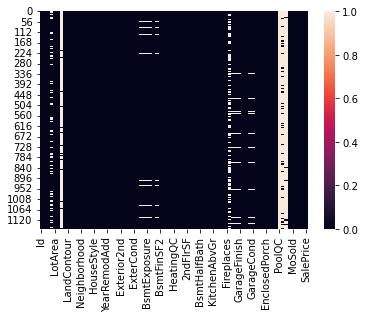

In [6]:
sns.heatmap(df.isna())

In [7]:
pd.set_option("display.max_rows",None)

To display all the rows

In [8]:
df.rename(columns={'2ndFlrSF':'SecondFlrSF'},inplace=True)

In [9]:
df.drop(columns=['Id','Alley','Utilities','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

Dropping Alley, PoolQC, Fence and MiscFeature since it has more than 80% missing values.
Dropping Utilities since it has just one unique value.
Dropping Id since there are different values for each row.

In [10]:
df['LotFrontage']=df['LotFrontage'].fillna(df['LotFrontage'].mean())
df['MasVnrType']=df['MasVnrType'].fillna(df['MasVnrType'].mode()[0])
df['MasVnrArea']=df['MasVnrArea'].fillna(df['MasVnrArea'].mean())
df['BsmtQual']=df['BsmtQual'].fillna(df['BsmtQual'].mode()[0])
df['BsmtCond']=df['BsmtCond'].fillna(df['BsmtCond'].mode()[0])
df['BsmtExposure']=df['BsmtExposure'].fillna(df['BsmtExposure'].mode()[0])
df['BsmtFinType1']=df['BsmtFinType1'].fillna(df['BsmtFinType1'].mode()[0])
df['BsmtFinType2']=df['BsmtFinType2'].fillna(df['BsmtFinType2'].mode()[0])
df['FireplaceQu']=df['FireplaceQu'].fillna(df['FireplaceQu'].mode()[0])
df['GarageType']=df['GarageType'].fillna(df['GarageType'].mode()[0])
df['GarageYrBlt']=df['GarageYrBlt'].fillna(df['GarageYrBlt'].mean())
df['GarageFinish']=df['GarageFinish'].fillna(df['GarageFinish'].mode()[0])
df['GarageQual']=df['GarageQual'].fillna(df['GarageQual'].mode()[0])
df['GarageCond']=df['GarageCond'].fillna(df['GarageCond'].mode()[0])

We have filled the null values by using mean and mode method.

<AxesSubplot:>

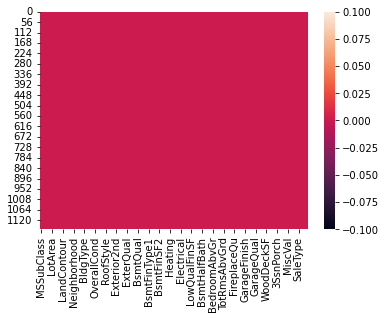

In [11]:
sns.heatmap(df.isna())

As we can see in the heatmap, we don't have any null values present in our dataset.

In [12]:
y=df['SalePrice']
X=df.drop(columns=['SalePrice'])

Separating the independent and dependent variables to visualize further with respect to the target variable.

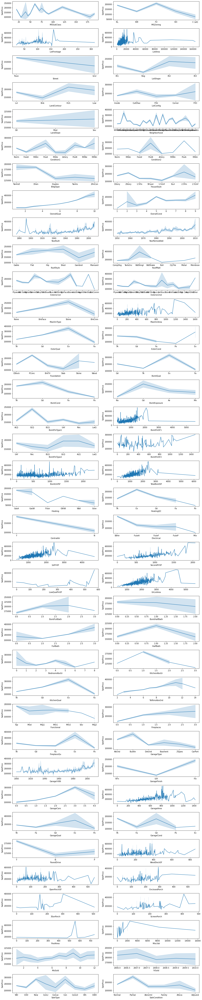

In [13]:
plt.figure(figsize=(15,75),facecolor='white')
plotnumber=1

for column in X:
    if plotnumber<=76:
        ax=plt.subplot(38,2,plotnumber)
        sns.lineplot(X[column],y)
        plt.xlabel(column,fontsize=10)
        plt.ylabel('SalePrice',fontsize=10)
    
    plotnumber+=1
plt.tight_layout()

#### From the above data visualization:

1. Sale Price is highest for Floating Residential Village and lowest for Commercial zone.
2. Sale Price is highest for Paved Street and lowest for Gravel Street.
3. Sale Price is highest for Moderately Irregular shaped property and lowest for Regular shaped property.
4. Sale Price increases with Total square feet of basement area but it falls drastically after 2500 square feet area.
5. Sale Price is highest on the Hillside flatness whereas lowest in the banked flatness.
6. Sale Price doesn't have much of an impact on Type of Land Slope or Neighborhood.
7. Better the quality, higher the sale price.
8. Although not monotonic, but there's an increase in sale price with better overall condition.
9. The sale prices were highest during the late 19th century but fell sharply during the early 20th century and since then the prices have been increasing year by year.
10. Also the Sale price increases with every remodelling done.
11. Sale price is highest for houses with Shed roofs and lowest for houses with Gambrel roofs.
12. Sale price is highest for roofs made with Wood Shingles material and lowest for roofs made with Roll material.
13. Houses of Stone Masonry Veneer type have the highest sale price while houses of Brick common masonry veneer type have the lowest sale price.
14. Sale price increases with increase in Masonry veneer area but gradually declines after 1200 square feet area.
15. Sale price ih highest for Poured Concrete foundation and lowest for Slab foundation.
16. Sale Price increases with increase in Total square feet of Basement area but gradually declines from 2500 sq. ft. area.
17. Sale prices are highest for houses with central air conditioning.
18. Prices increase with increase in first floor square feet but there is a gradual decline after 2500 sq. ft.
19. Prices increase with increase in Second floor sq. ft alothough not monotonic.
20. Prices increase with increase in Ground living area sq. ft although there is a sharp decline after 4500 sq. ft. area.
21. Prices decline with better quality of basement half bathrooms.

In [14]:
df_numericals=df[['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','SecondFlrSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','MoSold','YrSold']]

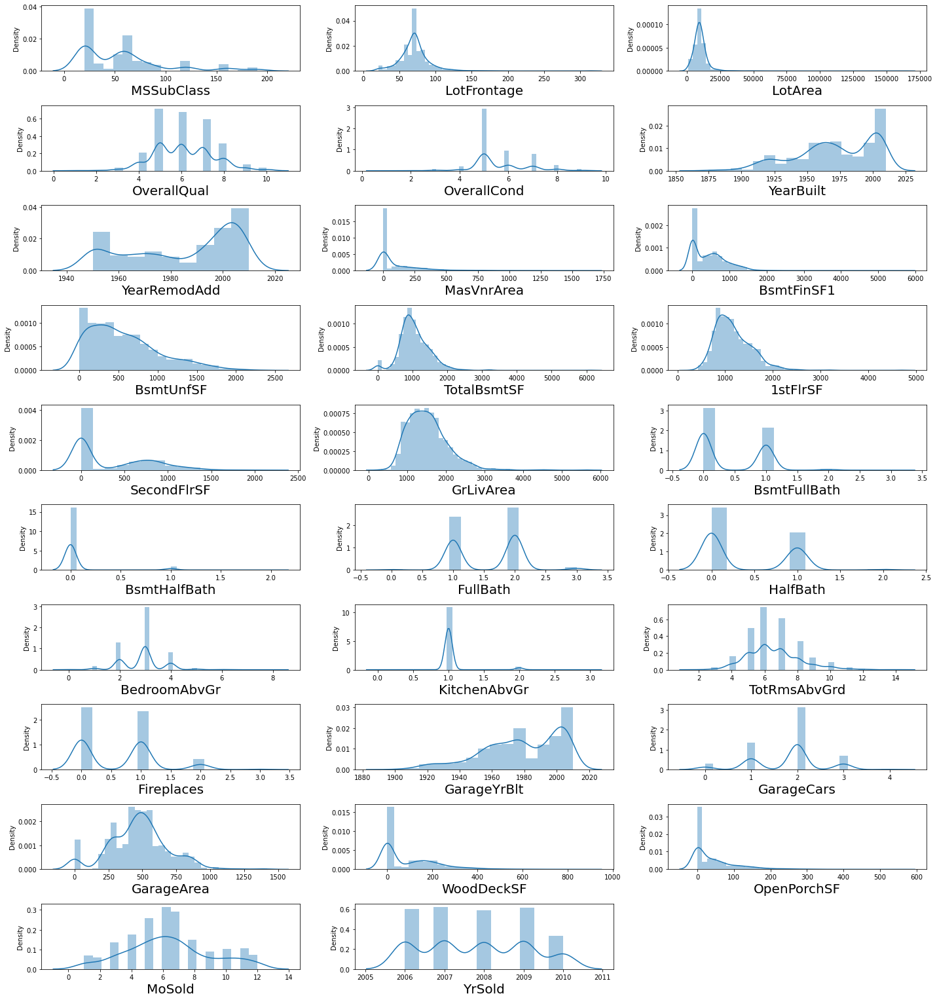

In [15]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1

for column in df_numericals:
    if plotnumber<=36:
        ax=plt.subplot(12,3,plotnumber)
        sns.distplot(df_numericals[column])
        plt.xlabel(column,fontsize=20)
    
    plotnumber+=1
plt.tight_layout()

Most of the variables are not normally distributed.

<AxesSubplot:xlabel='YrSold', ylabel='count'>

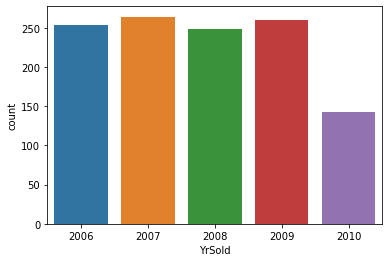

In [16]:
sns.countplot(df.YrSold)

We had more house sales in 2009 and least in 2010.

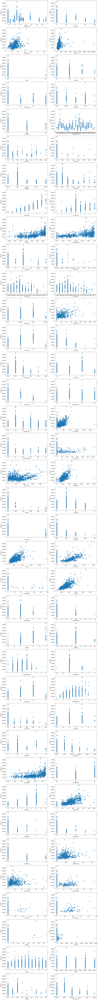

In [17]:
plt.figure(figsize=(15,155),facecolor='white')
plotnumber=1

for column in X:
    if plotnumber<=76:
        ax=plt.subplot(38,2,plotnumber)
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=10)
        plt.ylabel('SalePrice',fontsize=10)
    
    plotnumber+=1
plt.tight_layout()

### From the above data visualization:

1. 'GrLivArea' and 'TotalBsmtSF' appear to be correlated with 'SalePrice' in a linear fashion. Both correlations are positive, which implies that when one variable increases, so does the other. In the instance of 'TotalBsmtSF,' the slope of the linear connection is extremely steep.
2. 'OverallQual' and 'YearBuilt' appear to be connected to 'SalePrice' as well. The relationship appears to be greater in the case of 'OverallQual,' where the scatter plot demonstrates how sales prices increase as overall quality improves.

In [18]:
#Converting strings into numberical format

from sklearn.preprocessing import LabelEncoder

lab_enc=LabelEncoder()

df1=lab_enc.fit_transform(df['MSZoning'])
df2=lab_enc.fit_transform(df['Street'])
df3=lab_enc.fit_transform(df['LotShape'])
df4=lab_enc.fit_transform(df['LandContour'])
df6=lab_enc.fit_transform(df['LotConfig'])
df7=lab_enc.fit_transform(df['LandSlope'])
df8=lab_enc.fit_transform(df['Neighborhood'])

df9=lab_enc.fit_transform(df['Condition1'])
df10=lab_enc.fit_transform(df['Condition2'])
df11=lab_enc.fit_transform(df['BldgType'])
df12=lab_enc.fit_transform(df['HouseStyle'])
df13=lab_enc.fit_transform(df['RoofStyle'])
df14=lab_enc.fit_transform(df['RoofMatl'])
df15=lab_enc.fit_transform(df['Exterior1st'])
df16=lab_enc.fit_transform(df['Exterior2nd'])

df17=lab_enc.fit_transform(df['MasVnrType'])
df18=lab_enc.fit_transform(df['ExterQual'])
df19=lab_enc.fit_transform(df['ExterCond'])
df20=lab_enc.fit_transform(df['Foundation'])
df21=lab_enc.fit_transform(df['BsmtQual'])
df22=lab_enc.fit_transform(df['BsmtCond'])
df23=lab_enc.fit_transform(df['BsmtExposure'])
df24=lab_enc.fit_transform(df['BsmtFinType1'])

df25=lab_enc.fit_transform(df['BsmtFinType2'])
df26=lab_enc.fit_transform(df['Heating'])
df27=lab_enc.fit_transform(df['HeatingQC'])
df28=lab_enc.fit_transform(df['CentralAir'])
df29=lab_enc.fit_transform(df['Electrical'])
df30=lab_enc.fit_transform(df['KitchenQual'])
df31=lab_enc.fit_transform(df['Functional'])
df32=lab_enc.fit_transform(df['FireplaceQu'])

df33=lab_enc.fit_transform(df['GarageType'])
df34=lab_enc.fit_transform(df['GarageFinish'])
df35=lab_enc.fit_transform(df['GarageQual'])
df36=lab_enc.fit_transform(df['GarageCond'])
df37=lab_enc.fit_transform(df['PavedDrive'])
df38=lab_enc.fit_transform(df['SaleType'])
df39=lab_enc.fit_transform(df['SaleCondition'])

df['MSZoning']=df1
df['Street']=df2
df['LotShape']=df3
df['LandContour']=df4
df['LotConfig']=df6
df['LandSlope']=df7
df['Neighborhood']=df8

df['Condition1']=df9
df['Condition2']=df10
df['BldgType']=df11
df['HouseStyle']=df12
df['RoofStyle']=df13
df['RoofMatl']=df14
df['Exterior1st']=df15
df['Exterior2nd']=df16

df['MasVnrType']=df17
df['ExterQual']=df18
df['ExterCond']=df19
df['Foundation']=df20
df['BsmtQual']=df21
df['BsmtCond']=df22
df['BsmtExposure']=df23
df['BsmtFinType1']=df24

df['BsmtFinType2']=df25
df['Heating']=df26
df['HeatingQC']=df27
df['CentralAir']=df28
df['Electrical']=df29
df['KitchenQual']=df30
df['Functional']=df31
df['FireplaceQu']=df32

df['GarageType']=df33
df['GarageFinish']=df34
df['GarageQual']=df35
df['GarageCond']=df36
df['PavedDrive']=df37
df['SaleType']=df38
df['SaleCondition']=df39

We have converted our categorical data to numerical data

### Finding correlation

In [19]:
df_corrnumericals=df[['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','SecondFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold','SalePrice']]

In [20]:
df_corrcategorical=df[['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition','SalePrice']]

In [21]:
corr_1=df_corrnumericals.corr()
print(corr_1.shape)
corr_2=df_corrcategorical.corr()
print(corr_2.shape)

(37, 37)
(39, 39)


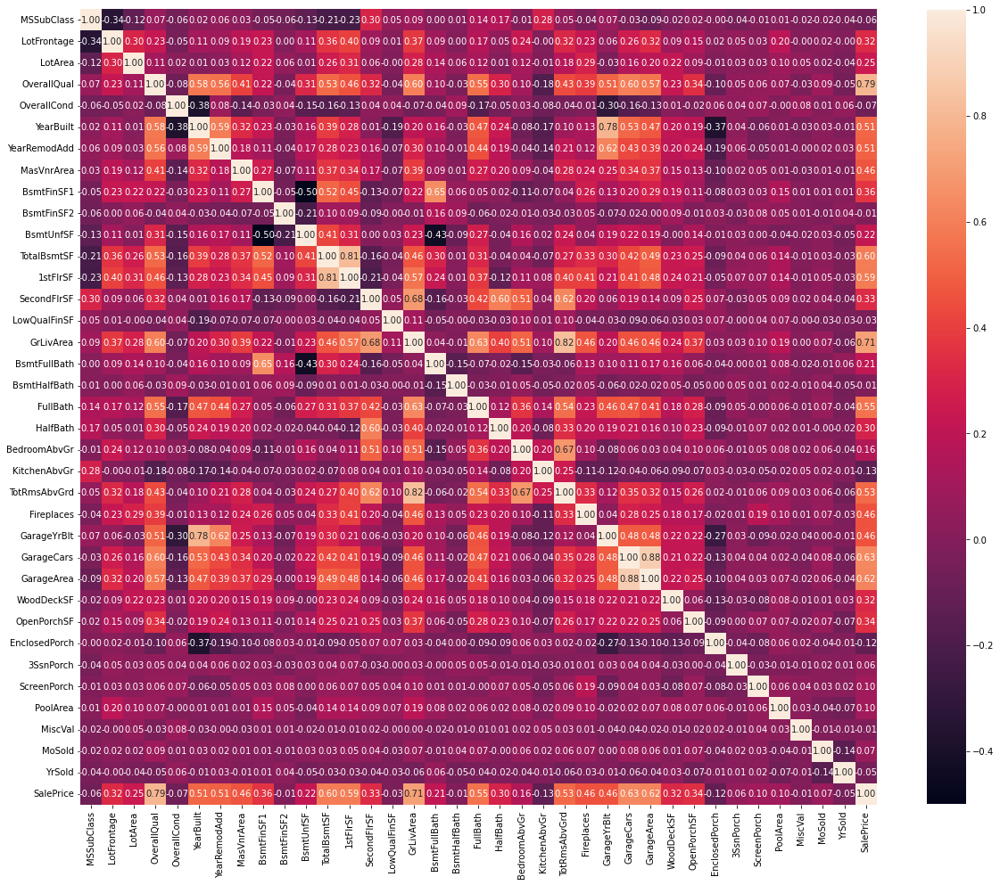

In [22]:
plt.figure(figsize=(20,20))

sns.heatmap(corr_1,cbar=True,square=True,cbar_kws={'shrink':0.82},fmt='.2f',annot=True,annot_kws={'size':10})
plt.show()

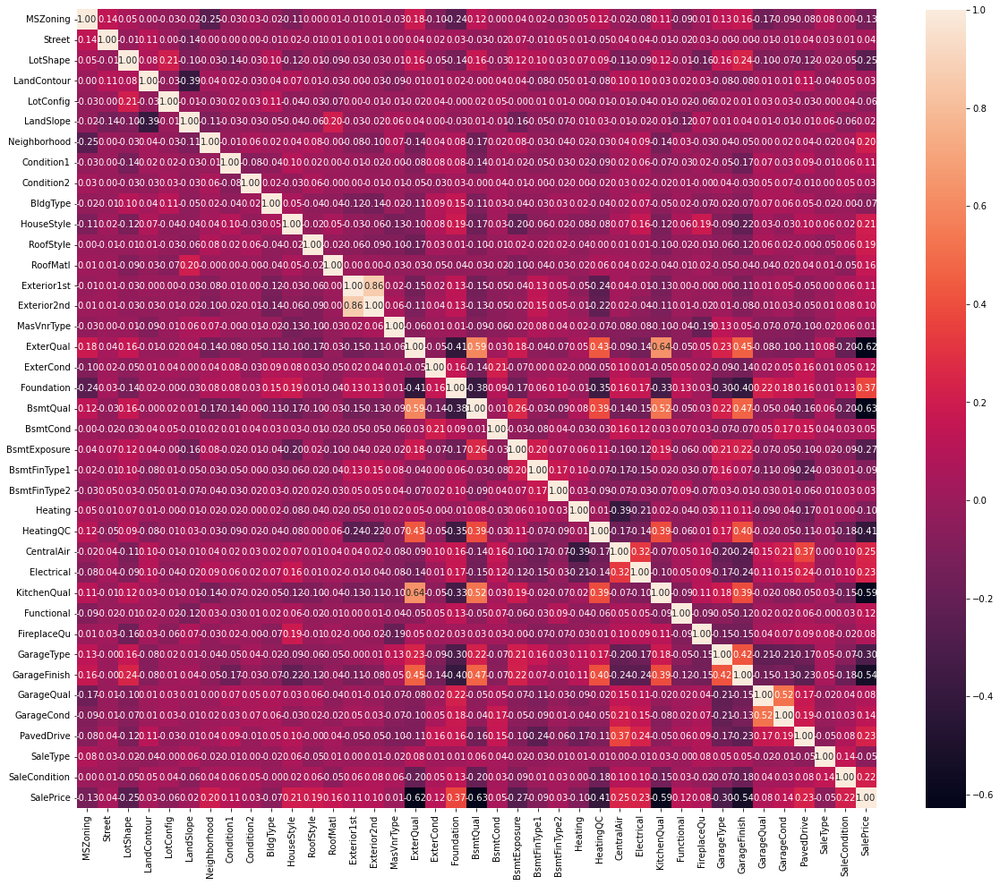

In [23]:
plt.figure(figsize=(20,20))

sns.heatmap(corr_2,cbar=True,square=True,cbar_kws={'shrink':0.82},fmt='.2f',annot=True,annot_kws={'size':10})
plt.show()

In [24]:
df.corr()['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.707300
GarageCars       0.628329
GarageArea       0.619000
TotalBsmtSF      0.595042
1stFlrSF         0.587642
FullBath         0.554988
TotRmsAbvGrd     0.528363
YearBuilt        0.514408
YearRemodAdd     0.507831
MasVnrArea       0.463626
Fireplaces       0.459611
GarageYrBlt      0.458007
Foundation       0.374169
BsmtFinSF1       0.362874
OpenPorchSF      0.339500
SecondFlrSF      0.330386
LotFrontage      0.323779
WoodDeckSF       0.315444
HalfBath         0.295592
LotArea          0.249499
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
SaleCondition    0.217687
BsmtUnfSF        0.215724
BsmtFullBath     0.212924
HouseStyle       0.205502
Neighborhood     0.198942
RoofStyle        0.192654
RoofMatl         0.159865
BedroomAbvGr     0.158281
GarageCond       0.135071
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1       0.105820
PoolArea    

### From the above data visualization:

1. OverallQual has the highest positive correlation with SalePrice followed closely by GrLivarea while OverallCond, KitchenAbvGr, EnclosedPorch have the lowest correlations with SalePrice. (Numerical values)
2. GarageCars and GarageArea are also some of the most strongly correlated variables.
3. TotalBsmtSF and 1stFlrSF are also strongly correlated variables.
4. TotRmsAbvGrd and GrLivArea are also strongly correlated.

### Finding Outliers

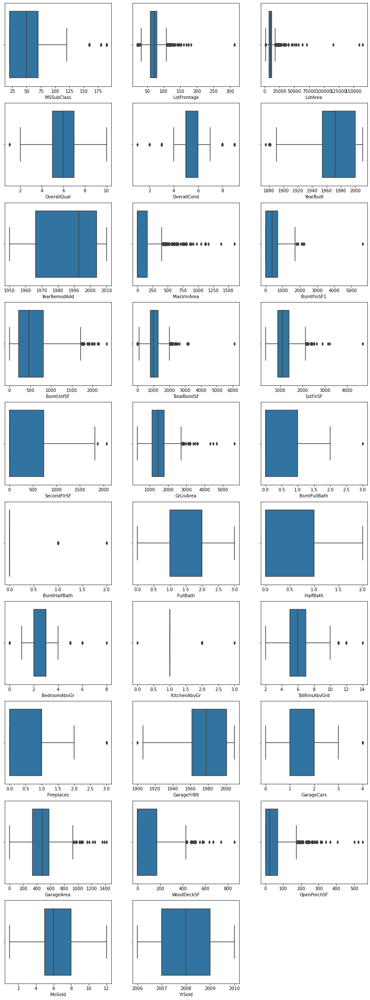

In [25]:
plt.figure(figsize=(15,50))
graph=1

for column in df_numericals:
    if(graph<=36):
        ax=plt.subplot(12,3,graph)
        sns.boxplot(df_numericals[column],orient='v')
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

We see there are many outliers in most of the variables.

### Removing Outliers

In [26]:
#Find the IQR (inter quantile range) to identify outliers

q1=df.quantile(0.25) #1st quantile
q3=df.quantile(0.75) #3rd quantile

#IQR
iqr=q3-q1
iqr

MSSubClass          50.00
MSZoning             0.00
LotFrontage         19.25
LotArea           3894.00
Street               0.00
LotShape             3.00
LandContour          0.00
LotConfig            2.00
LandSlope            0.00
Neighborhood        10.00
Condition1           0.00
Condition2           0.00
BldgType             0.00
HouseStyle           3.00
OverallQual          2.00
OverallCond          1.00
YearBuilt           46.00
YearRemodAdd        38.00
RoofStyle            0.00
RoofMatl             0.00
Exterior1st          4.00
Exterior2nd          5.00
MasVnrType           1.00
MasVnrArea         160.00
ExterQual            1.00
ExterCond            0.00
Foundation           1.00
BsmtQual             1.00
BsmtCond             0.00
BsmtExposure         1.00
BsmtFinType1         4.00
BsmtFinSF1         714.50
BsmtFinType2         0.00
BsmtFinSF2           0.00
BsmtUnfSF          600.00
TotalBsmtSF        492.50
Heating              0.00
HeatingQC            4.00
CentralAir  

In [27]:
index=np.where(df['BsmtFinSF1']>(q3.BsmtFinSF1)+(1.5*iqr.BsmtFinSF1))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1161, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [28]:
index=np.where(df['TotalBsmtSF']<(q1.TotalBsmtSF)-(1.5*iqr.TotalBsmtSF))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1131, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [29]:
index=np.where(df['LotArea']<(q1.LotArea)-(1.5*iqr.LotArea))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1120, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [30]:
index=np.where(df['YearBuilt']<(q1.YearBuilt)-(1.5*iqr.YearBuilt))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1114, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [31]:
index=np.where(df['GarageYrBlt']<(q1.GarageYrBlt)-(1.5*iqr.GarageYrBlt))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1113, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [32]:
index=np.where(df['SecondFlrSF']>(q3.SecondFlrSF)+(1.5*iqr.SecondFlrSF))
df=df.drop(df.index[index])
print('Shape:',df.shape)
df.reset_index()

Shape: (1112, 75)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,120,3,70.98847,4928,1,0,3,4,0,...,0,0,0,0,0,2,2007,8,4,128000
1,1,20,3,95.00000,15865,1,0,3,4,1,...,0,0,224,0,0,10,2007,8,4,268000
2,2,60,3,92.00000,9920,1,0,3,1,0,...,0,0,0,0,0,6,2007,8,4,269790
3,3,20,3,105.00000,11751,1,0,3,4,0,...,0,0,0,0,0,1,2010,0,4,190000
4,4,20,3,70.98847,16635,1,0,3,2,0,...,0,0,0,0,0,6,2009,8,4,215000
5,5,60,3,58.00000,14054,1,0,3,4,0,...,0,0,0,0,0,11,2006,6,5,219210
6,6,20,3,70.98847,11341,1,0,3,4,0,...,0,0,95,0,0,5,2010,8,4,121500
7,7,20,3,88.00000,13125,1,3,3,0,0,...,0,0,0,0,0,1,2006,8,4,155000
8,8,20,3,70.00000,9170,1,3,3,0,0,...,184,0,0,0,400,4,2007,8,4,140000
9,9,50,3,80.00000,8480,1,3,3,4,0,...,102,0,0,0,0,10,2008,0,0,118500


In [33]:
(1168-1112)/1168*100

4.794520547945205

We did not remove all the outliers since that would cause a huge amount of data loss. Right now we have lost around 5% of data which is affordable.

### Removing skewness

In [34]:
df_numericals.skew()

MSSubClass       1.422019
LotFrontage      2.710383
LotArea         10.659285
OverallQual      0.175082
OverallCond      0.580714
YearBuilt       -0.579204
YearRemodAdd    -0.495864
MasVnrArea       2.834658
BsmtFinSF1       1.871606
BsmtUnfSF        0.909057
TotalBsmtSF      1.744591
1stFlrSF         1.513707
SecondFlrSF      0.823479
GrLivArea        1.449952
BsmtFullBath     0.627106
BsmtHalfBath     4.264403
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.644657
Fireplaces       0.671966
GarageYrBlt     -0.662934
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       1.504929
OpenPorchSF      2.410840
MoSold           0.220979
YrSold           0.115765
dtype: float64

In [35]:
df['LotFrontage']=np.sqrt(df['LotFrontage'])
df['LotArea']=np.sqrt(df['LotArea'])
df['MasVnrArea']=np.sqrt(df['MasVnrArea'])
df['BsmtFinSF1']=np.sqrt(df['BsmtFinSF1'])
df['BsmtFinSF2']=np.sqrt(df['BsmtFinSF2'])
df['BsmtUnfSF']=np.sqrt(df['BsmtUnfSF'])
df['TotalBsmtSF']=np.sqrt(df['TotalBsmtSF'])
df['1stFlrSF']=np.sqrt(df['1stFlrSF'])
df['SecondFlrSF']=np.sqrt(df['SecondFlrSF'])
df['LowQualFinSF']=np.sqrt(df['LowQualFinSF'])
df['GrLivArea']=np.sqrt(df['GrLivArea'])
df['WoodDeckSF']=np.sqrt(df['WoodDeckSF'])
df['OpenPorchSF']=np.sqrt(df['OpenPorchSF'])
df['EnclosedPorch']=np.sqrt(df['EnclosedPorch'])
df['3SsnPorch']=np.sqrt(df['3SsnPorch'])
df['ScreenPorch']=np.sqrt(df['ScreenPorch'])
df['PoolArea']=np.sqrt(df['PoolArea'])
df['MiscVal']=np.sqrt(df['MiscVal'])

## Selecting best feature

In [36]:
from sklearn.feature_selection import SelectKBest, f_classif

In [37]:
y=df['SalePrice']
X=df.drop(columns=['SalePrice'])

In [38]:
X.shape

(1112, 74)

In [39]:
best_features=SelectKBest(score_func=f_classif,k=40)
fit=best_features.fit(X,y)
df_scores=pd.DataFrame(fit.scores_)
df_columns=pd.DataFrame(X.columns)

feature_scores=pd.concat([df_columns,df_scores],axis=1)
feature_scores.columns=['Feature_Name','Score'] #name output columns
print(feature_scores.nlargest(40,'Score')) #print 40 best features

    Feature_Name     Score
14   OverallQual  5.149582
24     ExterQual  3.572308
43     GrLivArea  3.126663
27      BsmtQual  2.807488
50   KitchenQual  2.738808
58    GarageCars  2.468362
46      FullBath  2.432211
59    GarageArea  2.373555
40      1stFlrSF  2.268067
57  GarageFinish  2.190499
16     YearBuilt  2.179121
35   TotalBsmtSF  2.123556
17  YearRemodAdd  1.821069
4         Street  1.816640
56   GarageYrBlt  1.751381
1       MSZoning  1.687061
51  TotRmsAbvGrd  1.629845
26    Foundation  1.585004
53    Fireplaces  1.584844
23    MasVnrArea  1.580853
64   OpenPorchSF  1.570705
3        LotArea  1.543094
69       MiscVal  1.490801
38    CentralAir  1.451007
31    BsmtFinSF1  1.449826
47      HalfBath  1.351555
5       LotShape  1.343748
37     HeatingQC  1.318367
36       Heating  1.288921
28      BsmtCond  1.268416
9   Neighborhood  1.258020
63    WoodDeckSF  1.251856
2    LotFrontage  1.236566
54   FireplaceQu  1.203226
55    GarageType  1.194020
41   SecondFlrSF  1.189878
2

We have selected 40 best features with respect to Sale Price among the 74 features.

In [40]:
df=df[['OverallQual','ExterQual','GrLivArea','BsmtQual','KitchenQual','GarageCars','FullBath','GarageArea','1stFlrSF','GarageFinish','YearBuilt','TotalBsmtSF','YearRemodAdd','Street','GarageYrBlt','MSZoning','TotRmsAbvGrd','Foundation','Fireplaces','MasVnrArea','OpenPorchSF','LotArea','MiscVal','CentralAir','BsmtFinSF1','HalfBath','LotShape','HeatingQC','Heating','BsmtCond','Neighborhood','WoodDeckSF','LotFrontage','FireplaceQu','GarageType','SecondFlrSF','BsmtExposure','MasVnrType','Electrical','BldgType']]

In [41]:
X=df

In [42]:
X.shape

(1112, 40)

In [43]:
#Feature Scaling
scaler=StandardScaler()
X_scaler=scaler.fit_transform(X)

vif=pd.DataFrame()
vif['score']=[variance_inflation_factor(X_scaler,i) for i in range(X_scaler.shape[1])]
vif['Features']=X.columns

vif

,score,Features
0,3.411386,OverallQual
1,2.424910,ExterQual
2,43.818682,GrLivArea
3,2.041251,BsmtQual
4,2.046020,KitchenQual
5,5.528327,GarageCars
6,3.070291,FullBath
7,5.342874,GarageArea
8,28.276521,1stFlrSF
9,1.948804,GarageFinish


In [44]:
X.drop(columns=['SecondFlrSF'],axis=1,inplace=True)

Dropped SecondFlrSF since it was highly correlated with GrLivArea.

## Finding best random state

In [45]:
maxAccu=0
maxRs=0
for i in range(1,200):
    X_train,x_test,Y_train,y_test=train_test_split(X_scaler,y,test_size=0.25,random_state=i)
    mod=DecisionTreeRegressor()
    mod.fit(X_train,Y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRs=i
print("Best accuracy is:",maxAccu,"on Random State",maxRs)

Best accuracy is: 0.8194083520546025 on Random State 62


In [46]:
X_train,x_test,Y_train,y_test=train_test_split(X_scaler,y,test_size=0.25,random_state=185)

### Predicting with different models

In [47]:
DTC=DecisionTreeRegressor()
DTC.fit(X_train,Y_train)
pred=DTC.predict(x_test)
print(r2_score(y_test,pred))

0.7544678459447679


In [48]:
lr=LinearRegression()
lr.fit(X_train,Y_train)
pred=lr.predict(x_test)
print(r2_score(y_test,pred))

0.8838209898296074


In [49]:
RFR=RandomForestRegressor()
RFR.fit(X_train,Y_train)
pred=RFR.predict(x_test)
print(r2_score(y_test,pred))

0.891960022473681


In [50]:
from sklearn.ensemble import AdaBoostRegressor
ada=AdaBoostRegressor()
ada.fit(X_train,Y_train)
pred=ada.predict(x_test)
print(r2_score(y_test,pred))

0.8433343654629151


In [51]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
gbr.fit(X_train,Y_train)
pred=gbr.predict(x_test)
print(r2_score(y_test,pred))

0.9139572287219385


In [52]:
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor()
knn.fit(X_train,Y_train)
pred=knn.predict(x_test)
print(r2_score(y_test,pred))

0.8391263401691001


In [55]:
! pip install xgboost

     |████████████████████████████████| 1.7 MB 1.1 MB/s eta 0:00:01


In [56]:
import xgboost as xgb
xgb=xgb.XGBRegressor()
xgb.fit(X_train,Y_train)
pred=xgb.predict(x_test)
print(r2_score(y_test,pred))

0.9008225747150398


## Regularization

In [57]:
from sklearn.linear_model import Lasso

In [58]:
parameters={'alpha':[.0001,.001,.01,.1,1,10],'random_state':list(range(0,10))}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(X_train,Y_train)
print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [59]:
ls=Lasso(alpha=10,random_state=0)
ls.fit(X_train,Y_train)
ls.score(X_train,Y_train)
pred_ls=ls.predict(x_test)

lss=r2_score(y_test,pred_ls)
lss

0.8838455350351817

## Cross validation

In [60]:
from sklearn.model_selection import cross_val_score

In [61]:
print(cross_val_score(DTC,X_scaler,y,cv=5).mean())

0.7122321470545246


In [62]:
print(cross_val_score(lr,X_scaler,y,cv=5).mean())

0.8536637395737239


In [63]:
print(cross_val_score(RFR,X_scaler,y,cv=5).mean())

0.8612223408281124


In [64]:
print(cross_val_score(ada,X_scaler,y,cv=5).mean())

0.8140014778058955


In [65]:
print(cross_val_score(gbr,X_scaler,y,cv=5).mean())

0.876469677987594


In [66]:
print(cross_val_score(knn,X_scaler,y,cv=5).mean())

0.7973955361663048


In [67]:
print(cross_val_score(xgb,X_scaler,y,cv=5).mean())

0.8591662058575767


## Hyperparameter Tuning

In [68]:
parameters={'criterion':['friedman_mse','squared_error','mse','mae'],'max_features':['auto','sqrt','log2'],'n_estimators':[40,47,49,50],'learning_rate':[0.30,0.40,0.45],'loss':['squared_error','ls','absolute_error','lad','huber','quantile']}
GBR=GradientBoostingRegressor()
clf=RandomizedSearchCV(GBR, cv=5, param_distributions=parameters)
clf.fit(X_train,Y_train)

print(clf.best_params_)

{'n_estimators': 47, 'max_features': 'auto', 'loss': 'ls', 'learning_rate': 0.4, 'criterion': 'mae'}


In [69]:
Final_model=GradientBoostingRegressor(max_features='auto',criterion='mse',n_estimators=47,loss='ls',learning_rate=0.3)
Final_model.fit(X_train,Y_train)
pred=Final_model.predict(x_test)
acc=r2_score(y_test,pred)
print('Accuracy:',acc*100)

Accuracy: 90.22856981858308


The accuracy has increased to 91%

## Saving Model

In [70]:
import pickle
filename='FinalisedModel_Housing_Final.pkl'
pickle.dump(gbr,open(filename,'wb'))

# Test Data

In [71]:
df1=pd.read_csv('test.csv')
df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [72]:
df1.shape

(292, 80)

In [73]:
df1.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

<AxesSubplot:>

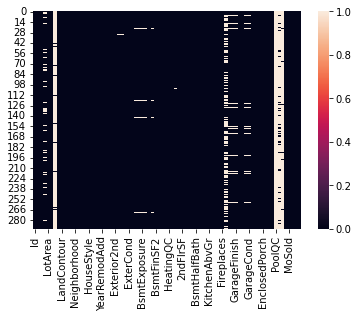

In [74]:
sns.heatmap(df1.isna())

In [75]:
df1.rename(columns={'2ndFlrSF':'SecondFlrSF'},inplace=True)

In [76]:
df1.drop(columns=['Id','Alley','Utilities','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [77]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     292 non-null    int64  
 1   MSZoning       292 non-null    object 
 2   LotFrontage    247 non-null    float64
 3   LotArea        292 non-null    int64  
 4   Street         292 non-null    object 
 5   LotShape       292 non-null    object 
 6   LandContour    292 non-null    object 
 7   LotConfig      292 non-null    object 
 8   LandSlope      292 non-null    object 
 9   Neighborhood   292 non-null    object 
 10  Condition1     292 non-null    object 
 11  Condition2     292 non-null    object 
 12  BldgType       292 non-null    object 
 13  HouseStyle     292 non-null    object 
 14  OverallQual    292 non-null    int64  
 15  OverallCond    292 non-null    int64  
 16  YearBuilt      292 non-null    int64  
 17  YearRemodAdd   292 non-null    int64  
 18  RoofStyle 

In [78]:
df1['LotFrontage']=df1['LotFrontage'].fillna(df1['LotFrontage'].mean())
df1['MasVnrType']=df1['MasVnrType'].fillna(df1['MasVnrType'].mode()[0])
df1['MasVnrArea']=df1['MasVnrArea'].fillna(df1['MasVnrArea'].mean())
df1['BsmtQual']=df1['BsmtQual'].fillna(df1['BsmtQual'].mode()[0])
df1['BsmtCond']=df1['BsmtCond'].fillna(df1['BsmtCond'].mode()[0])
df1['BsmtExposure']=df1['BsmtExposure'].fillna(df1['BsmtExposure'].mode()[0])
df1['BsmtFinType1']=df1['BsmtFinType1'].fillna(df1['BsmtFinType1'].mode()[0])
df1['BsmtFinType2']=df1['BsmtFinType2'].fillna(df1['BsmtFinType2'].mode()[0])
df1['Electrical']=df1['Electrical'].fillna(df1['Electrical'].mode()[0])
df1['FireplaceQu']=df1['FireplaceQu'].fillna(df1['FireplaceQu'].mode()[0])
df1['GarageType']=df1['GarageType'].fillna(df1['GarageType'].mode()[0])
df1['GarageYrBlt']=df1['GarageYrBlt'].fillna(df1['GarageYrBlt'].mean())
df1['GarageFinish']=df1['GarageFinish'].fillna(df1['GarageFinish'].mode()[0])
df1['GarageQual']=df1['GarageQual'].fillna(df1['GarageQual'].mode()[0])
df1['GarageCond']=df1['GarageCond'].fillna(df1['GarageCond'].mode()[0])

<AxesSubplot:>

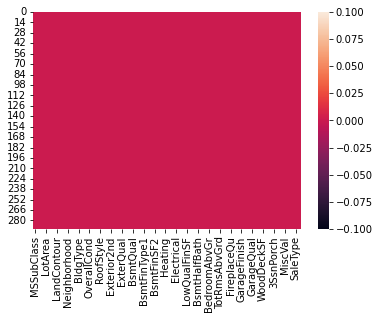

In [79]:
sns.heatmap(df1.isna())

In [80]:
#Converting strings into numberical format

from sklearn.preprocessing import LabelEncoder

lab_enc=LabelEncoder()

df111=lab_enc.fit_transform(df1['MSZoning'])
df2=lab_enc.fit_transform(df1['Street'])
df3=lab_enc.fit_transform(df1['LotShape'])
df4=lab_enc.fit_transform(df1['LandContour'])
df6=lab_enc.fit_transform(df1['LotConfig'])
df7=lab_enc.fit_transform(df1['LandSlope'])
df8=lab_enc.fit_transform(df1['Neighborhood'])

df9=lab_enc.fit_transform(df1['Condition1'])
df10=lab_enc.fit_transform(df1['Condition2'])
df11=lab_enc.fit_transform(df1['BldgType'])
df12=lab_enc.fit_transform(df1['HouseStyle'])
df13=lab_enc.fit_transform(df1['RoofStyle'])
df14=lab_enc.fit_transform(df1['RoofMatl'])
df15=lab_enc.fit_transform(df1['Exterior1st'])
df16=lab_enc.fit_transform(df1['Exterior2nd'])

df17=lab_enc.fit_transform(df1['MasVnrType'])
df18=lab_enc.fit_transform(df1['ExterQual'])
df19=lab_enc.fit_transform(df1['ExterCond'])
df20=lab_enc.fit_transform(df1['Foundation'])
df21=lab_enc.fit_transform(df1['BsmtQual'])
df22=lab_enc.fit_transform(df1['BsmtCond'])
df23=lab_enc.fit_transform(df1['BsmtExposure'])
df24=lab_enc.fit_transform(df1['BsmtFinType1'])

df25=lab_enc.fit_transform(df1['BsmtFinType2'])
df26=lab_enc.fit_transform(df1['Heating'])
df27=lab_enc.fit_transform(df1['HeatingQC'])
df28=lab_enc.fit_transform(df1['CentralAir'])
df29=lab_enc.fit_transform(df1['Electrical'])
df30=lab_enc.fit_transform(df1['KitchenQual'])
df31=lab_enc.fit_transform(df1['Functional'])
df32=lab_enc.fit_transform(df1['FireplaceQu'])

df33=lab_enc.fit_transform(df1['GarageType'])
df34=lab_enc.fit_transform(df1['GarageFinish'])
df35=lab_enc.fit_transform(df1['GarageQual'])
df36=lab_enc.fit_transform(df1['GarageCond'])
df37=lab_enc.fit_transform(df1['PavedDrive'])
df38=lab_enc.fit_transform(df1['SaleType'])
df39=lab_enc.fit_transform(df1['SaleCondition'])

df1['MSZoning']=df111
df1['Street']=df2
df1['LotShape']=df3
df1['LandContour']=df4
df1['LotConfig']=df6
df1['LandSlope']=df7
df1['Neighborhood']=df8

df1['Condition1']=df9
df1['Condition2']=df10
df1['BldgType']=df11
df1['HouseStyle']=df12
df1['RoofStyle']=df13
df1['RoofMatl']=df14
df1['Exterior1st']=df15
df1['Exterior2nd']=df16

df1['MasVnrType']=df17
df1['ExterQual']=df18
df1['ExterCond']=df19
df1['Foundation']=df20
df1['BsmtQual']=df21
df1['BsmtCond']=df22
df1['BsmtExposure']=df23
df1['BsmtFinType1']=df24

df1['BsmtFinType2']=df25
df1['Heating']=df26
df1['HeatingQC']=df27
df1['CentralAir']=df28
df1['Electrical']=df29
df1['KitchenQual']=df30
df1['Functional']=df31
df1['FireplaceQu']=df32

df1['GarageType']=df33
df1['GarageFinish']=df34
df1['GarageQual']=df35
df1['GarageCond']=df36
df1['PavedDrive']=df37
df1['SaleType']=df38
df1['SaleCondition']=df39

In [81]:
df1_corrnumericals=df1[['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','SecondFlrSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','MiscVal','MoSold','YrSold']]
df1_corrcategorical=df1[['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition']]
corr_11=df1_corrnumericals.corr()
print(corr_11.shape)
corr_12=df1_corrcategorical.corr()
print(corr_12.shape)

(34, 34)
(38, 38)


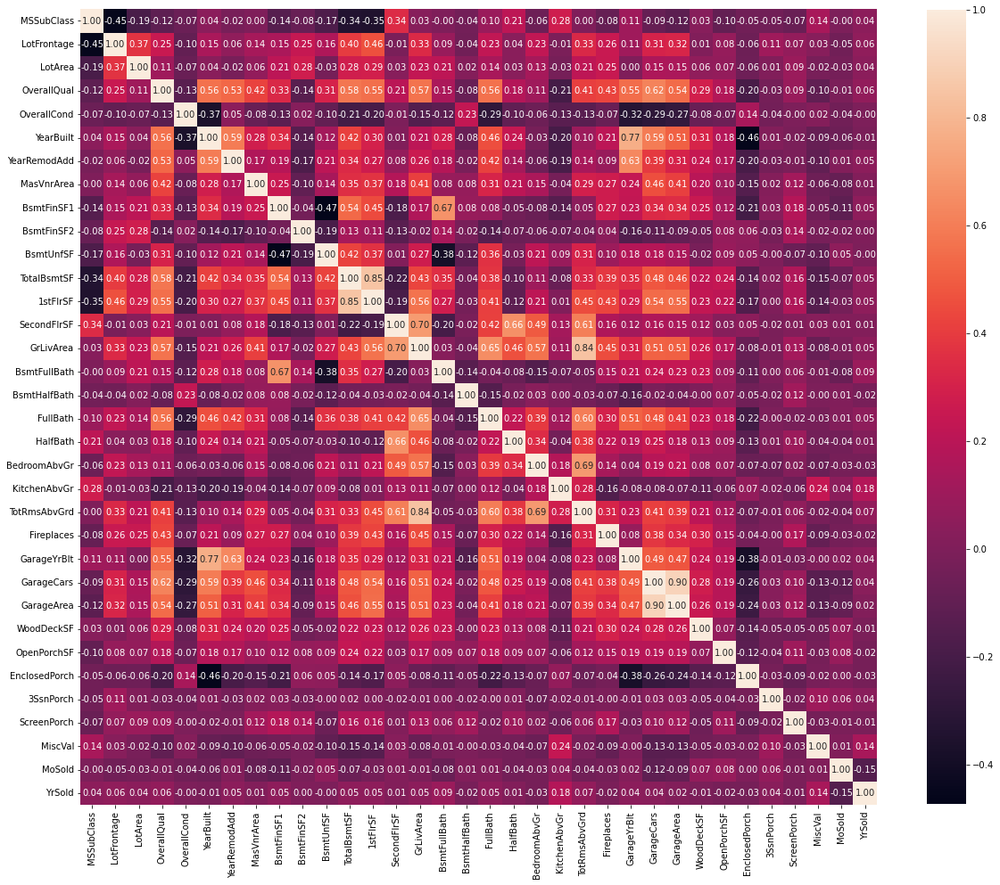

In [82]:
plt.figure(figsize=(20,20))

sns.heatmap(corr_11,cbar=True,square=True,cbar_kws={'shrink':0.82},fmt='.2f',annot=True,annot_kws={'size':10})
plt.show()

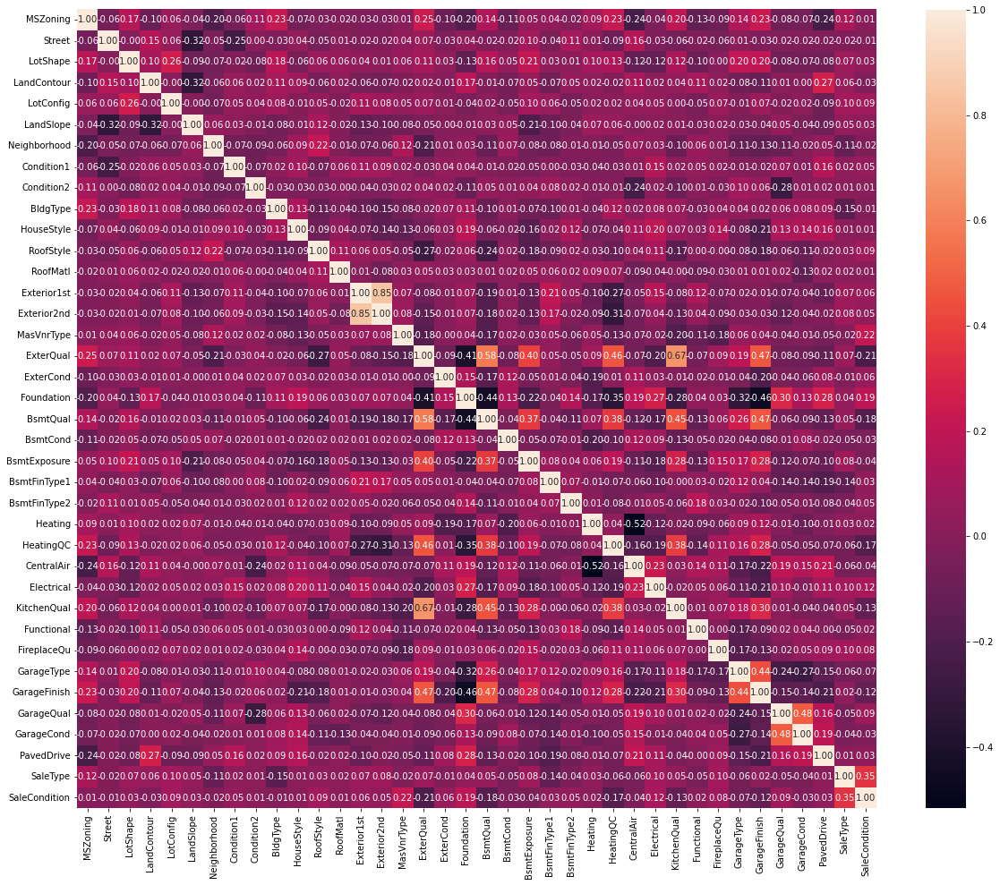

In [83]:
plt.figure(figsize=(20,20))

sns.heatmap(corr_12,cbar=True,square=True,cbar_kws={'shrink':0.82},fmt='.2f',annot=True,annot_kws={'size':10})
plt.show()

In [84]:
df1_numericals=df1[['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','SecondFlrSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','MoSold','YrSold']]

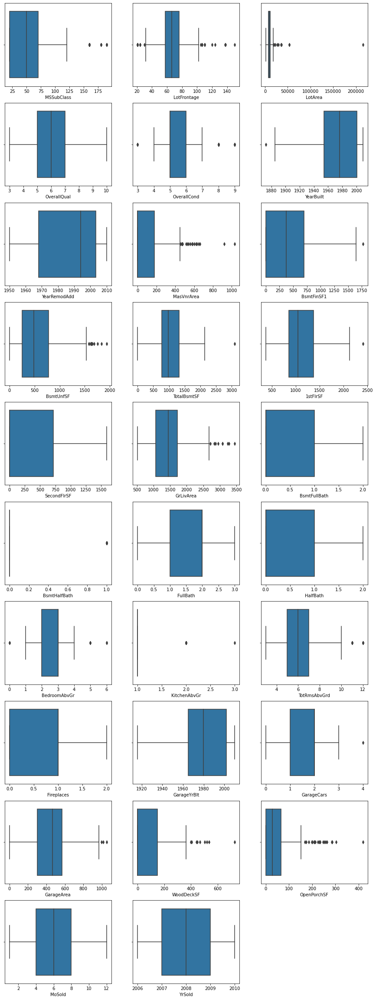

In [85]:
plt.figure(figsize=(15,50))
graph=1

for column in df1_numericals:
    if(graph<=36):
        ax=plt.subplot(12,3,graph)
        sns.boxplot(df1_numericals[column],orient='v')
        plt.xlabel(column,fontsize=10)
    graph+=1
plt.show()

In [86]:
#Find the IQR (inter quantile range) to identify outliers

q11=df1.quantile(0.25) #1st quantile
q13=df1.quantile(0.75) #3rd quantile

#IQR
iqr1=q13-q11
iqr1

MSSubClass         50.00
MSZoning            0.00
LotFrontage        18.25
LotArea          4458.75
Street              0.00
LotShape            3.00
LandContour         0.00
LotConfig           2.00
LandSlope           0.00
Neighborhood       10.00
Condition1          0.00
Condition2          0.00
BldgType            0.00
HouseStyle          3.00
OverallQual         2.00
OverallCond         1.00
YearBuilt          47.00
YearRemodAdd       35.25
RoofStyle           0.00
RoofMatl            0.00
Exterior1st         4.00
Exterior2nd         4.00
MasVnrType          1.00
MasVnrArea        180.00
ExterQual           1.00
ExterCond           0.00
Foundation          1.00
BsmtQual            1.00
BsmtCond            0.00
BsmtExposure        1.00
BsmtFinType1        3.25
BsmtFinSF1        700.50
BsmtFinType2        0.00
BsmtFinSF2          0.00
BsmtUnfSF         525.00
TotalBsmtSF       550.25
Heating             0.00
HeatingQC           3.00
CentralAir          0.00
Electrical          0.00


In [87]:
index=np.where(df1['BsmtFinSF1']>(q13.BsmtFinSF1)+(1.5*iqr1.BsmtFinSF1))
df1=df1.drop(df1.index[index])
print('Shape:',df1.shape)
df1.reset_index()

Shape: (291, 74)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,20,2,86.000000,14157,1,0,1,0,0,...,51,0,0,0,0,0,7,2007,5,2
1,1,120,2,66.425101,5814,1,0,3,1,0,...,0,0,0,0,0,0,8,2009,0,0
2,2,20,2,66.425101,11838,1,3,3,4,0,...,151,0,0,0,0,0,6,2009,5,2
3,3,70,2,75.000000,12000,1,3,0,4,0,...,0,0,0,0,0,0,7,2009,5,2
4,4,60,2,86.000000,14598,1,0,3,1,0,...,18,0,0,0,0,0,1,2008,5,2
5,5,180,3,21.000000,1936,1,3,3,4,0,...,0,0,0,0,0,0,12,2007,5,2
6,6,180,3,35.000000,3675,1,3,3,4,0,...,28,0,0,0,0,0,5,2006,5,2
7,7,20,2,107.000000,13891,1,3,3,4,0,...,102,0,0,0,0,0,1,2008,4,3
8,8,80,2,66.425101,12800,1,3,2,4,1,...,0,0,0,396,0,0,8,2009,5,2
9,9,120,3,32.000000,4500,1,3,3,2,0,...,247,0,0,0,0,0,6,2009,5,2


In [88]:
index=np.where(df1['YearBuilt']<(q11.YearBuilt)-(1.5*iqr1.YearBuilt))
df1=df1.drop(df1.index[index])
print('Shape:',df1.shape)
df1.reset_index()

Shape: (290, 74)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,20,2,86.000000,14157,1,0,1,0,0,...,51,0,0,0,0,0,7,2007,5,2
1,1,120,2,66.425101,5814,1,0,3,1,0,...,0,0,0,0,0,0,8,2009,0,0
2,2,20,2,66.425101,11838,1,3,3,4,0,...,151,0,0,0,0,0,6,2009,5,2
3,3,70,2,75.000000,12000,1,3,0,4,0,...,0,0,0,0,0,0,7,2009,5,2
4,4,60,2,86.000000,14598,1,0,3,1,0,...,18,0,0,0,0,0,1,2008,5,2
5,5,180,3,21.000000,1936,1,3,3,4,0,...,0,0,0,0,0,0,12,2007,5,2
6,6,180,3,35.000000,3675,1,3,3,4,0,...,28,0,0,0,0,0,5,2006,5,2
7,7,20,2,107.000000,13891,1,3,3,4,0,...,102,0,0,0,0,0,1,2008,4,3
8,8,80,2,66.425101,12800,1,3,2,4,1,...,0,0,0,396,0,0,8,2009,5,2
9,9,120,3,32.000000,4500,1,3,3,2,0,...,247,0,0,0,0,0,6,2009,5,2


In [89]:
index=np.where(df1['GrLivArea']>(q13.GrLivArea)+(1.5*iqr1.GrLivArea))
df1=df1.drop(df1.index[index])
print('Shape:',df1.shape)
df1.reset_index()

Shape: (281, 74)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,20,2,86.000000,14157,1,0,1,0,0,...,51,0,0,0,0,0,7,2007,5,2
1,1,120,2,66.425101,5814,1,0,3,1,0,...,0,0,0,0,0,0,8,2009,0,0
2,2,20,2,66.425101,11838,1,3,3,4,0,...,151,0,0,0,0,0,6,2009,5,2
3,3,70,2,75.000000,12000,1,3,0,4,0,...,0,0,0,0,0,0,7,2009,5,2
4,4,60,2,86.000000,14598,1,0,3,1,0,...,18,0,0,0,0,0,1,2008,5,2
5,5,180,3,21.000000,1936,1,3,3,4,0,...,0,0,0,0,0,0,12,2007,5,2
6,6,180,3,35.000000,3675,1,3,3,4,0,...,28,0,0,0,0,0,5,2006,5,2
7,7,20,2,107.000000,13891,1,3,3,4,0,...,102,0,0,0,0,0,1,2008,4,3
8,8,80,2,66.425101,12800,1,3,2,4,1,...,0,0,0,396,0,0,8,2009,5,2
9,9,120,3,32.000000,4500,1,3,3,2,0,...,247,0,0,0,0,0,6,2009,5,2


In [90]:
index=np.where(df1['GarageArea']>(q13.GarageArea)+(1.5*iqr1.GarageArea))
df1=df1.drop(df1.index[index])
print('Shape:',df1.shape)
df1.reset_index()

Shape: (280, 74)


,index,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,20,2,86.000000,14157,1,0,1,0,0,...,51,0,0,0,0,0,7,2007,5,2
1,1,120,2,66.425101,5814,1,0,3,1,0,...,0,0,0,0,0,0,8,2009,0,0
2,2,20,2,66.425101,11838,1,3,3,4,0,...,151,0,0,0,0,0,6,2009,5,2
3,3,70,2,75.000000,12000,1,3,0,4,0,...,0,0,0,0,0,0,7,2009,5,2
4,4,60,2,86.000000,14598,1,0,3,1,0,...,18,0,0,0,0,0,1,2008,5,2
5,5,180,3,21.000000,1936,1,3,3,4,0,...,0,0,0,0,0,0,12,2007,5,2
6,6,180,3,35.000000,3675,1,3,3,4,0,...,28,0,0,0,0,0,5,2006,5,2
7,7,20,2,107.000000,13891,1,3,3,4,0,...,102,0,0,0,0,0,1,2008,4,3
8,8,80,2,66.425101,12800,1,3,2,4,1,...,0,0,0,396,0,0,8,2009,5,2
9,9,120,3,32.000000,4500,1,3,3,2,0,...,247,0,0,0,0,0,6,2009,5,2


In [91]:
df1.skew()

MSSubClass        1.331953
MSZoning          0.153535
LotFrontage       0.359279
LotArea          13.480912
Street          -16.733201
LotShape         -0.661335
LandContour      -3.527520
LotConfig        -1.223326
LandSlope         5.225551
Neighborhood      0.070404
Condition1        2.747743
Condition2       16.733201
BldgType          1.928368
HouseStyle        0.422420
OverallQual       0.341174
OverallCond       1.206786
YearBuilt        -0.704984
YearRemodAdd     -0.505282
RoofStyle         1.532691
RoofMatl         13.431135
Exterior1st      -0.645414
Exterior2nd      -0.669445
MasVnrType       -0.005613
MasVnrArea        1.868331
ExterQual        -1.792813
ExterCond        -3.673505
Foundation        0.431404
BsmtQual         -1.378420
BsmtCond         -4.990508
BsmtExposure     -1.377689
BsmtFinType1      0.041174
BsmtFinSF1        0.720621
BsmtFinType2     -3.833882
BsmtFinSF2        3.837465
BsmtUnfSF         0.981947
TotalBsmtSF       0.206801
Heating           7.908070
H

In [92]:
df1['LotArea']=np.sqrt(df1['LotArea'])
df1['MasVnrArea']=np.sqrt(df1['MasVnrArea'])
df1['BsmtFinSF1']=np.sqrt(df1['BsmtFinSF1'])
df1['BsmtFinSF2']=np.sqrt(df1['BsmtFinSF2'])
df1['BsmtUnfSF']=np.sqrt(df1['BsmtUnfSF'])
df1['1stFlrSF']=np.sqrt(df1['1stFlrSF'])
df1['SecondFlrSF']=np.sqrt(df1['SecondFlrSF'])
df1['WoodDeckSF']=np.sqrt(df1['WoodDeckSF'])
df1['OpenPorchSF']=np.sqrt(df1['OpenPorchSF'])
df1['EnclosedPorch']=np.sqrt(df1['EnclosedPorch'])
df1['3SsnPorch']=np.sqrt(df1['3SsnPorch'])
df1['ScreenPorch']=np.sqrt(df1['ScreenPorch'])
df1['MiscVal']=np.sqrt(df1['MiscVal'])

In [93]:
df1.skew()

MSSubClass        1.331953
MSZoning          0.153535
LotFrontage       0.359279
LotArea           5.748202
Street          -16.733201
LotShape         -0.661335
LandContour      -3.527520
LotConfig        -1.223326
LandSlope         5.225551
Neighborhood      0.070404
Condition1        2.747743
Condition2       16.733201
BldgType          1.928368
HouseStyle        0.422420
OverallQual       0.341174
OverallCond       1.206786
YearBuilt        -0.704984
YearRemodAdd     -0.505282
RoofStyle         1.532691
RoofMatl         13.431135
Exterior1st      -0.645414
Exterior2nd      -0.669445
MasVnrType       -0.005613
MasVnrArea        0.900564
ExterQual        -1.792813
ExterCond        -3.673505
Foundation        0.431404
BsmtQual         -1.378420
BsmtCond         -4.990508
BsmtExposure     -1.377689
BsmtFinType1      0.041174
BsmtFinSF1       -0.099376
BsmtFinType2     -3.833882
BsmtFinSF2        2.997496
BsmtUnfSF        -0.308340
TotalBsmtSF       0.206801
Heating           7.908070
H

In [94]:
df1=df1[['OverallQual','ExterQual','GrLivArea','BsmtQual','KitchenQual','GarageCars','FullBath','GarageArea','1stFlrSF','GarageFinish','YearBuilt','TotalBsmtSF','YearRemodAdd','Street','GarageYrBlt','MSZoning','TotRmsAbvGrd','Foundation','Fireplaces','MasVnrArea','OpenPorchSF','LotArea','MiscVal','CentralAir','BsmtFinSF1','HalfBath','LotShape','HeatingQC','Heating','BsmtCond','Neighborhood','WoodDeckSF','LotFrontage','FireplaceQu','GarageType','SecondFlrSF','BsmtExposure','MasVnrType','Electrical','BldgType']]

In [95]:
df1.shape

(280, 40)

In [96]:
#Feature Scaling
scaler=StandardScaler()
X_scaled=scaler.fit_transform(df1)

vif=pd.DataFrame()
vif['score']=[variance_inflation_factor(X_scaler,i) for i in range(X_scaled.shape[1])]
vif['Features']=df1.columns

vif

,score,Features
0,3.411386,OverallQual
1,2.424910,ExterQual
2,43.818682,GrLivArea
3,2.041251,BsmtQual
4,2.046020,KitchenQual
5,5.528327,GarageCars
6,3.070291,FullBath
7,5.342874,GarageArea
8,28.276521,1stFlrSF
9,1.948804,GarageFinish


In [97]:
df1.drop(columns=['SecondFlrSF'], inplace=True)

In [98]:
df1.shape

(280, 39)

In [99]:
y_pred=gbr.predict(X_scaled)

In [100]:
y_pred

array([383758.40803782, 231557.87362096, 247082.86042353, 184402.15237363,
       228784.71720582,  78557.47047957, 138070.26071821, 368695.88050689,
       229370.63393585, 163182.08564235,  82345.18541002, 142031.13420669,
       138084.79680097, 307856.98885121, 103752.58616021, 120004.26461187,
       125197.64109978, 177762.37198688, 200216.11442486, 153513.37954415,
       141866.11948935, 152752.63872363,  84862.48762455,  98848.17413772,
       128796.81751758, 179783.20105104, 141221.55867706, 173073.94298595,
        89159.49457403, 156042.2998346 , 192958.27907928, 222782.70957811,
       173662.47034021, 118086.02408583, 173079.22834807, 206227.37528479,
       122286.51162894, 164286.64705234, 144697.13848417, 104409.05947711,
       333818.33905954, 209207.31640699, 193085.0412121 , 139973.32163591,
       127098.37122421, 130661.30906766, 105217.62577411, 234179.28392132,
       361953.7391358 , 148851.65606111, 193770.49798553, 100373.29946484,
       105582.64695247, 2